#1. Importation des bibliotheques


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.datasets import fashion_mnist
import tensorflow as tf
from tensorflow.keras import datasets
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVC
from xgboost import XGBClassifier
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from skimage.feature import hog
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
from sklearn.datasets import fetch_openml
from sklearn.preprocessing import StandardScaler
import joblib


# Charger et Préparer les Données et deviser 80 20


In [ ]:
(X_train, y_train), (X_test, y_test) = fashion_mnist.load_data()
# Normalize the data to be between 0 and 1
X_train = X_train.astype('float32') / 255.0
X_test = X_test.astype('float32') / 255.0
# Flatten the images (28x28 images become 784-dimensional vectors)
X_train = X_train.reshape(X_train.shape[0], 28*28)
X_test = X_test.reshape(X_test.shape[0], 28*28)
# Combine the training and testing data into one dataset
X_combined = np.concatenate((X_train, X_test), axis=0)
y_combined = np.concatenate((y_train, y_test), axis=0)
# Split the combined dataset into 80% training and 20% testing
x_train_final, x_test_final, y_train_final, y_test_final = train_test_split(
    X_combined, y_combined, test_size=0.2, random_state=42)
scaler = StandardScaler()
x_train_scaled = scaler.fit_transform(x_train_final)
x_test_scaled = scaler.transform(x_test_final)
print(f"Final training data size (X_train_final): {x_train_scaled.shape}")
print(f"Final training labels size (y_train_final): {y_train_final.shape}")
print(f"Final test data size (X_test_final): {x_test_scaled.shape}")
print(f"Final test labels size (y_test_final): {y_test_final.shape}")

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Final training data size (X_train_final): (56000, 784)
Final training labels size (y_train_final): (56000,)
Final test data size (X_test_final): (14000, 784)
Final test labels size (y_test_final): (14000,)


In [ ]:

class_names = [
    'T-shirt/top', 'Pantalon', 'Pull-over', 'Robe', 'Manteau',
    'Sandale','chemises', 'Baskets', 'Sac à main', 'Bottes'
]


# Entraînement et Prédiction des Modèles


# 1.   SVM






Training the SVM model...
Training complete.
Training Accuracy: 0.9821607142857143
Test Accuracy: 0.9049285714285714
Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.86      0.85      1394
           1       0.99      0.99      0.99      1402
           2       0.83      0.85      0.84      1407
           3       0.91      0.92      0.91      1449
           4       0.84      0.84      0.84      1357
           5       0.97      0.97      0.97      1449
           6       0.77      0.72      0.74      1407
           7       0.95      0.97      0.96      1359
           8       0.95      0.99      0.97      1342
           9       0.98      0.96      0.97      1434

    accuracy                           0.90     14000
   macro avg       0.90      0.90      0.90     14000
weighted avg       0.90      0.90      0.90     14000



TypeError: Invalid shape (784,) for image data

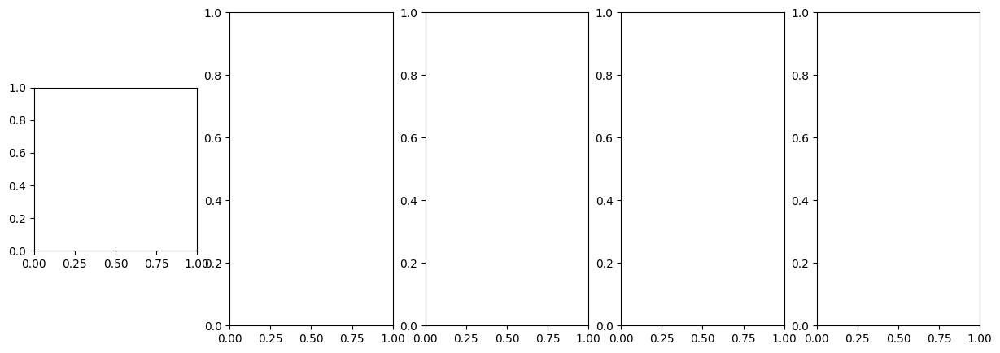

In [ ]:
# Create the SVM model
svm_model = SVC(kernel='rbf', C=10, gamma='scale')  # You can experiment with other parameters as well

# Train the model
print("Training the SVM model...")
svm_model.fit(x_train_scaled, y_train_final)
print("Training complete.")

# Make predictions on the test set
y_pred = svm_model.predict(x_test_scaled)

# Calculate the accuracy
train_accuracy = svm_model.score(x_train_scaled, y_train_final)
test_accuracy = svm_model.score(x_test_scaled, y_test_final)

# Print accuracy
print(f"Training Accuracy: {train_accuracy}")
print(f"Test Accuracy: {test_accuracy}")

# Print a classification report
print("Classification Report:")
print(classification_report(y_test_final, y_pred))

# Save the model to a file
joblib.dump(svm_model, 'fashion_mnist_svm_model.pkl')

# Optionally, save the scaler as well for preprocessing new images
joblib.dump(scaler, 'scaler.pkl')

# Plot a few sample predictions
fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for i in range(5):
    ax = axes[i]
    ax.imshow(x_test_final[i], cmap='gray')
    ax.set_title(f"Pred: {y_pred[i]} - True: {y_test[i]}")
    ax.axis('off')

plt.show()



# 2.   XGBoost



In [ ]:
# Initialiser et entraîner le modèle XGBoost
xgb = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, use_label_encoder=False, eval_metric='mlogloss')
xgb.fit(x_train_scaled, y_train_final)

# Prédire sur les données de test
y_pred_xgb = xgb.predict(x_test_scaled)

# Calculer l'exactitude sur les données d'entraînement
train_accuracy_xgb = xgb.score(x_train_scaled, y_train_final)

# Calculer l'exactitude sur les données de test
test_accuracy_xgb = xgb.score(x_test_scaled, y_test_final)

# Afficher l'exactitude sur les données d'entraînement et de test
print(f"Train Accuracy (xgb): {train_accuracy_xgb}")
print(f"Test Accuracy (xgb): {test_accuracy_xgb}")


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [12:38:34] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


Train Accuracy (xgb): 0.96125
Test Accuracy (xgb): 0.8914285714285715


# Évaluation des Modèles avec des Visualisations




# 2. Classification Report


In [ ]:
print("SVM Classification Report:")
print(classification_report(y_test_final, y_pred_svm))

print("XGBoost Classification Report:")
print(classification_report(y_test_final, y_pred_xgb))


SVM Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.86      0.85      1394
           1       0.99      0.98      0.99      1402
           2       0.83      0.85      0.84      1407
           3       0.90      0.92      0.91      1449
           4       0.84      0.84      0.84      1357
           5       0.98      0.97      0.97      1449
           6       0.76      0.71      0.74      1407
           7       0.94      0.97      0.96      1359
           8       0.98      0.98      0.98      1342
           9       0.98      0.96      0.97      1434

    accuracy                           0.90     14000
   macro avg       0.90      0.90      0.90     14000
weighted avg       0.90      0.90      0.90     14000

XGBoost Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.87      0.85      1394
           1       0.99      0.97      0.98      1402
           2       0

# 3.   Matrice de Confusion


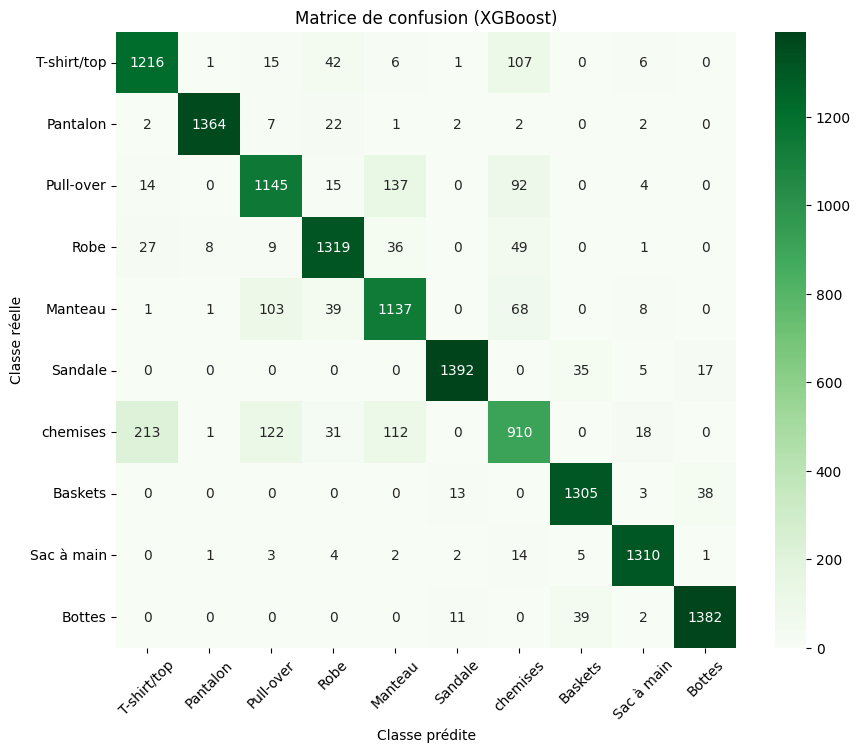

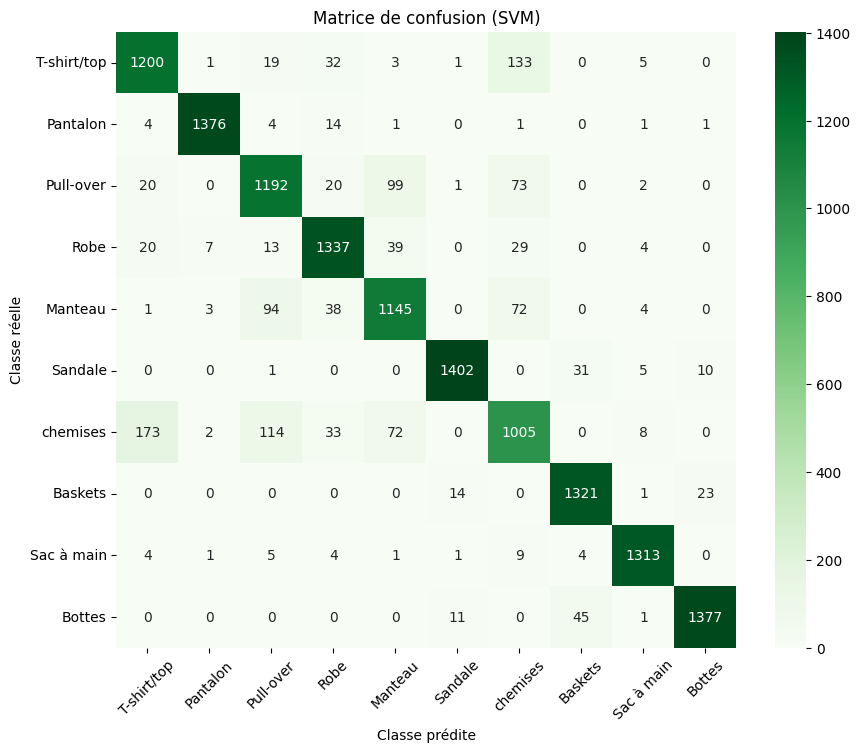

In [ ]:


# Fonction pour afficher la matrice de confusion et le rapport de classification
def evaluate_model(model_name, y_test_final, y_pred, class_names):
    # Calculer la matrice de confusion
    conf_matrix = confusion_matrix(y_test_final, y_pred)

    # Visualiser la matrice de confusion
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greens',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"Matrice de confusion ({model_name})")
    plt.xlabel("Classe prédite")
    plt.ylabel("Classe réelle")
    plt.xticks(rotation=45)  # Inclinaison des noms des classes pour une meilleure lisibilité
    plt.yticks(rotation=0)   # Garde les noms des classes verticalement
    plt.show()

# Évaluation des modèles
models_predictions = {
    "XGBoost": y_pred_xgb,
    "SVM": y_pred_svm,
}

# Boucle sur chaque modèle pour afficher les résultats
for model_name, y_pred in models_predictions.items():
    evaluate_model(model_name, y_test_final, y_pred, class_names)


# Data Augmentation and Visualization

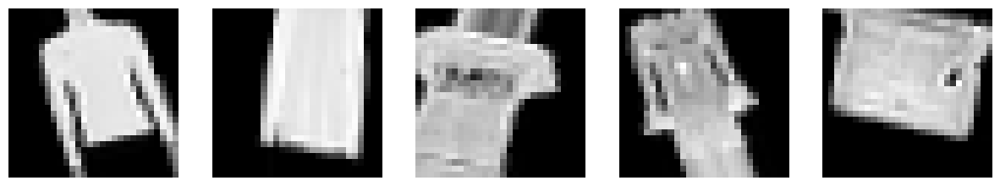

In [ ]:


# Assuming x_train_final is already loaded and has shape (56000, 784)
x_train_final = x_train_final.reshape(-1, 28, 28, 1)  # Reshape to (samples, height, width, channels)
x_train_final = x_train_final.astype('float32') / 255.0  # Normalize pixel values

# Create an ImageDataGenerator for data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,        # Rotate images by 20 degrees
    width_shift_range=0.2,    # Shift images horizontally by 20%
    height_shift_range=0.2,   # Shift images vertically by 20%
    shear_range=0.2,          # Shear images by 20%
    zoom_range=0.2,           # Zoom into images by 20%
    horizontal_flip=True,     # Randomly flip images horizontally
    fill_mode='nearest'       # Fill pixels after transformation
)

# Fit the data generator on the training images
datagen.fit(x_train_final)

# Set up a batch of augmented images for visualization
augmented_images = datagen.flow(x_train_final[:5], batch_size=5)

# Visualize the first few augmented images
fig, axes = plt.subplots(1, 5, figsize=(15, 15))
for i, ax in enumerate(axes):
    ax.imshow(augmented_images[0][i].reshape(28, 28), cmap='gray')
    ax.axis('off')

plt.show()


# Training XGBoost and SVM Models on Augmented data

In [ ]:


# Generate augmented data
augmented_data = []
augmented_labels = []

# Assuming y_train_final contains labels
for x_batch, y_batch in datagen.flow(x_train_final, y_train_final, batch_size=5000, shuffle=False):
    augmented_data.append(x_batch)
    augmented_labels.append(y_batch)
    if len(augmented_data) * 5000 >= 10000:  # Limit augmented samples to 10,000 for this example
        break

# Combine augmented data and labels
augmented_data = np.concatenate(augmented_data)
augmented_labels = np.concatenate(augmented_labels)

# Flatten augmented images for non-CNN models
flattened_data = augmented_data.reshape(augmented_data.shape[0], -1)

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(flattened_data, augmented_labels, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train, y_train)

# Train SVM model
svm_model = SVC(kernel='rbf', C=10, gamma='scale')

svm_model.fit(X_train, y_train)

# Predict and evaluate
xgb_preds = xgb_model.predict(X_test)
svm_preds = svm_model.predict(X_test)

print("XGBoost Accuracy:", accuracy_score(y_test, xgb_preds))
print("SVM Accuracy:", accuracy_score(y_test, svm_preds))


/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [20:23:02] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


XGBoost Accuracy: 0.6925
SVM Accuracy: 0.677


In [ ]:

# Load Fashion MNIST dataset
fashion_mnist = fetch_openml('Fashion-MNIST', version=1)
X = fashion_mnist.data
y = fashion_mnist.target.astype(int)

# Scale the features (important for SVM)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Split into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

# Define the objective function for SVM optimization
def objective(trial):
    # Sample hyperparameters
    C = trial.suggest_loguniform('C', 1e-5, 1e5)  # Regularization parameter
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf'])  # Kernel type
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])  # Kernel coefficient for 'rbf' kernel

    # Create and train the SVM model
    model = SVC(C=C, kernel=kernel, gamma=gamma)
    model.fit(X_train, y_train)

    # Predict and calculate accuracy
    y_pred = model.predict(X_test)
    accuracy = accuracy_score(y_test, y_pred)
    return accuracy

# Create and optimize the study
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=20)

# Print best parameters and accuracy
print('Best trial:', study.best_trial.params)
print('Best accuracy:', study.best_value)


NameError: name 'optuna' is not defined

# Visualisation de toutes les chemises

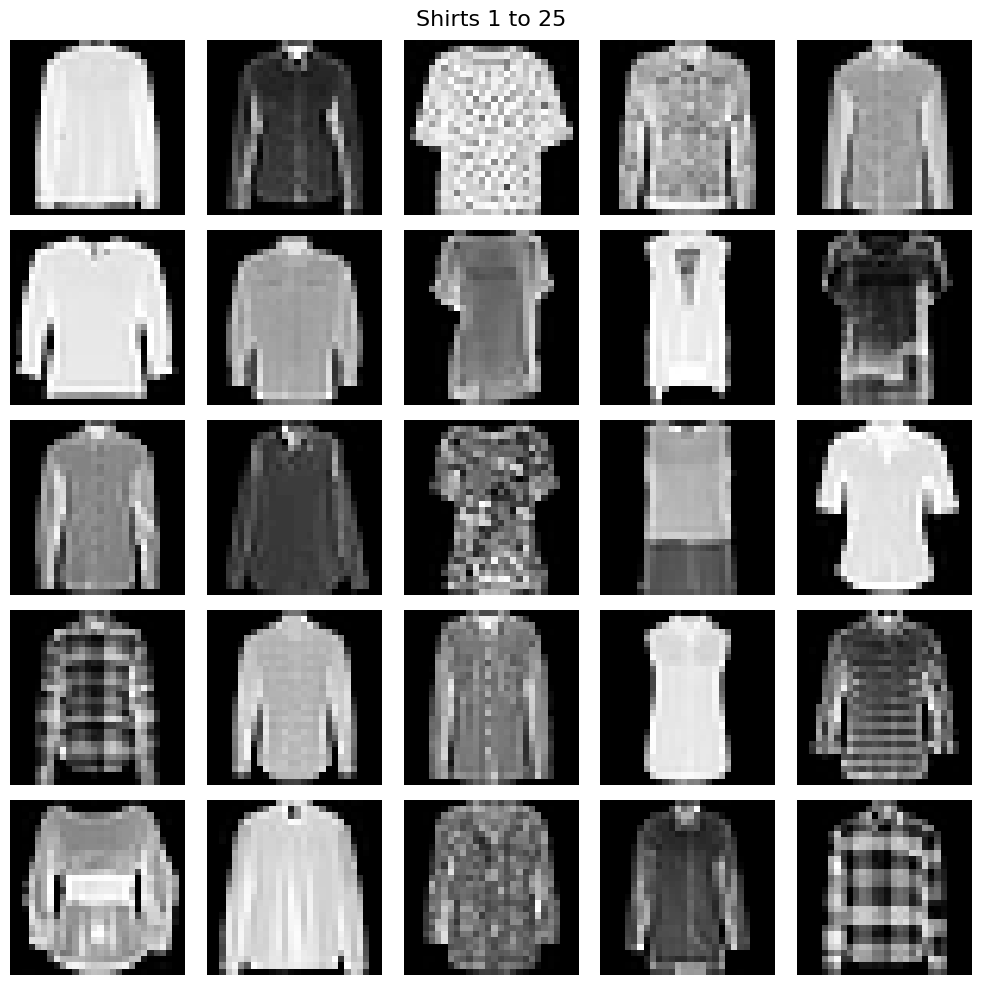

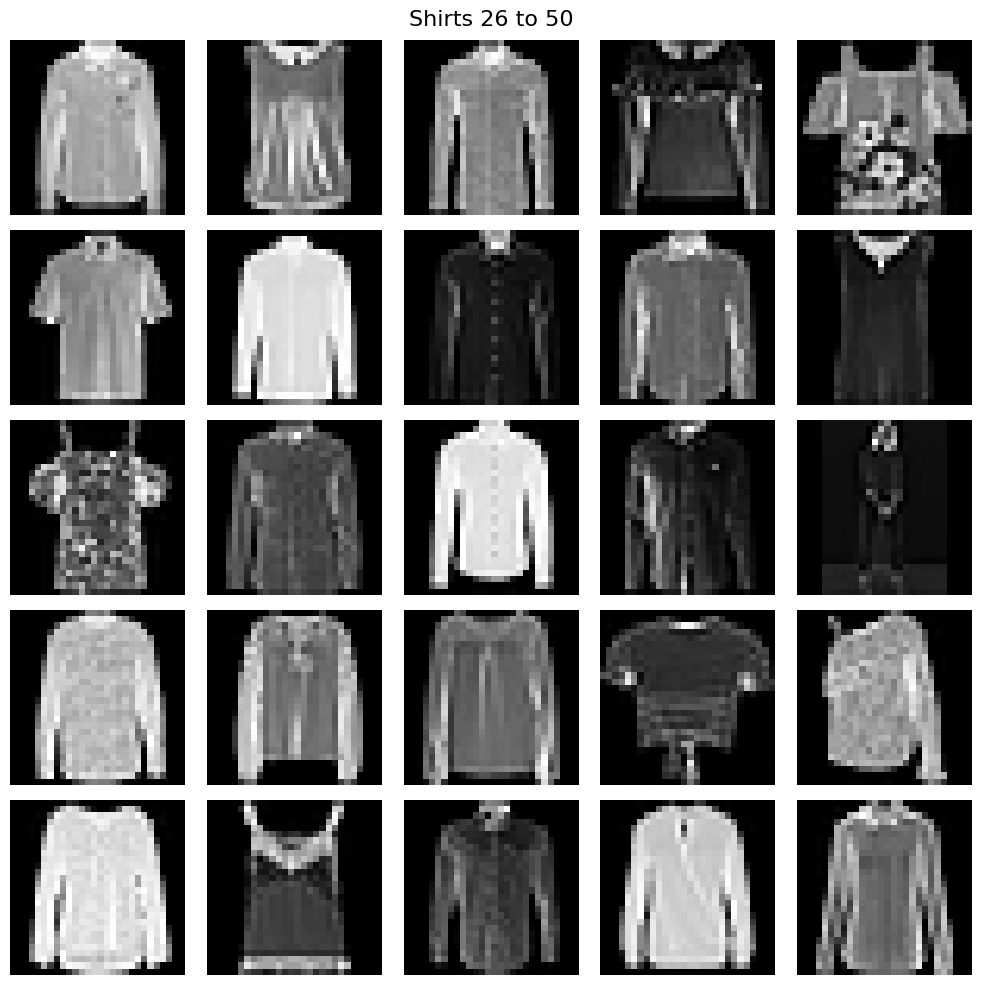

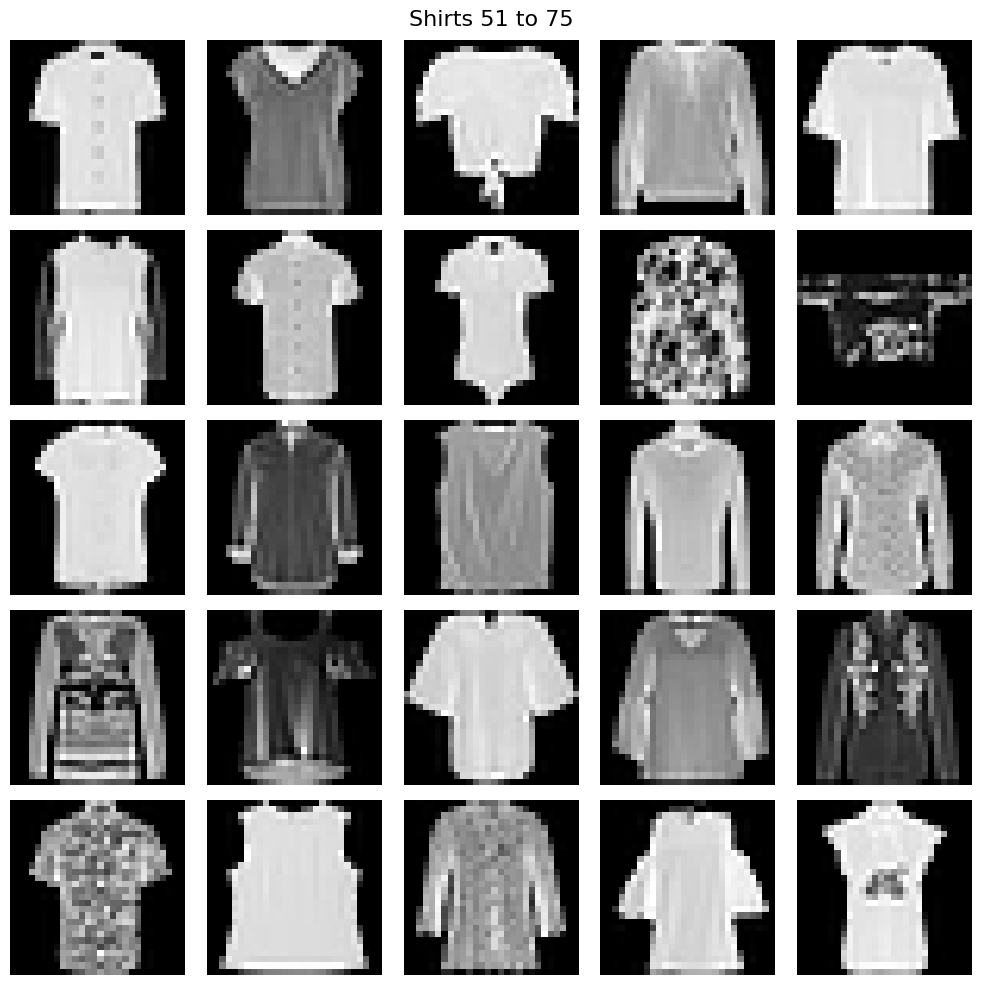

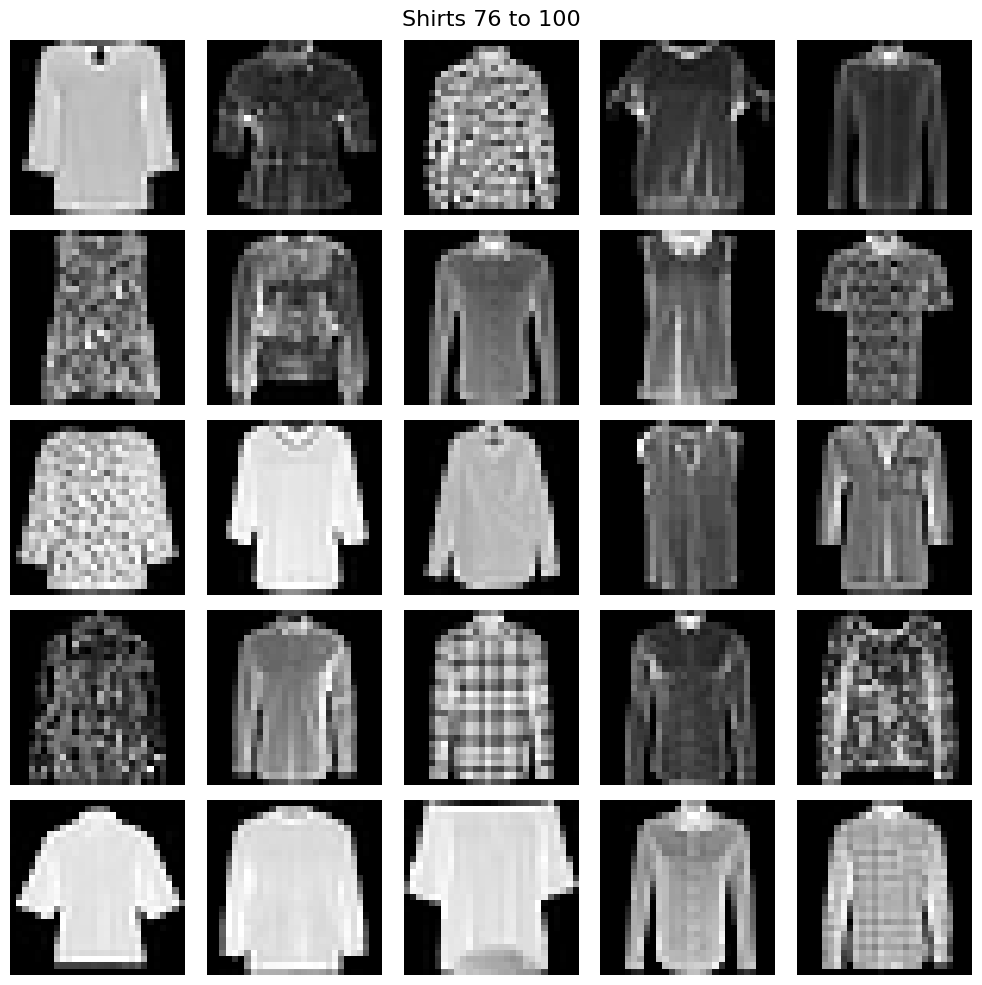

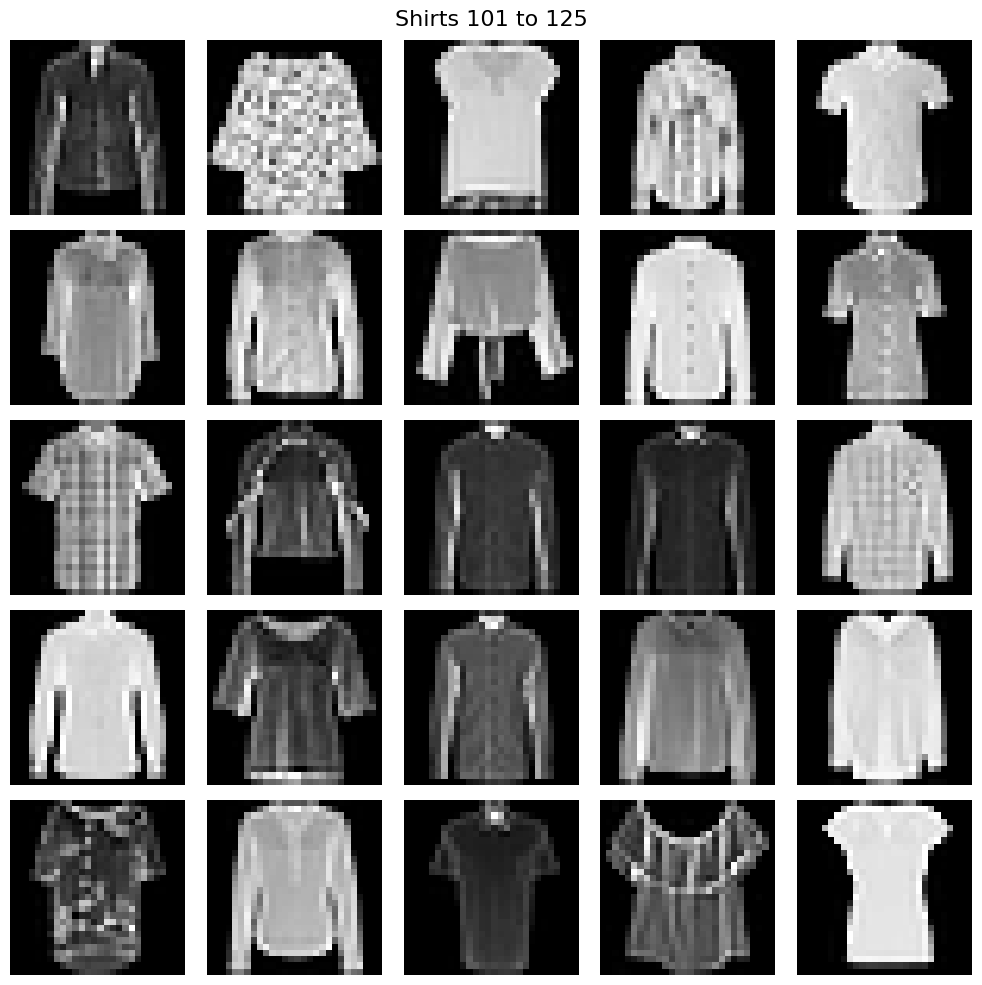

...

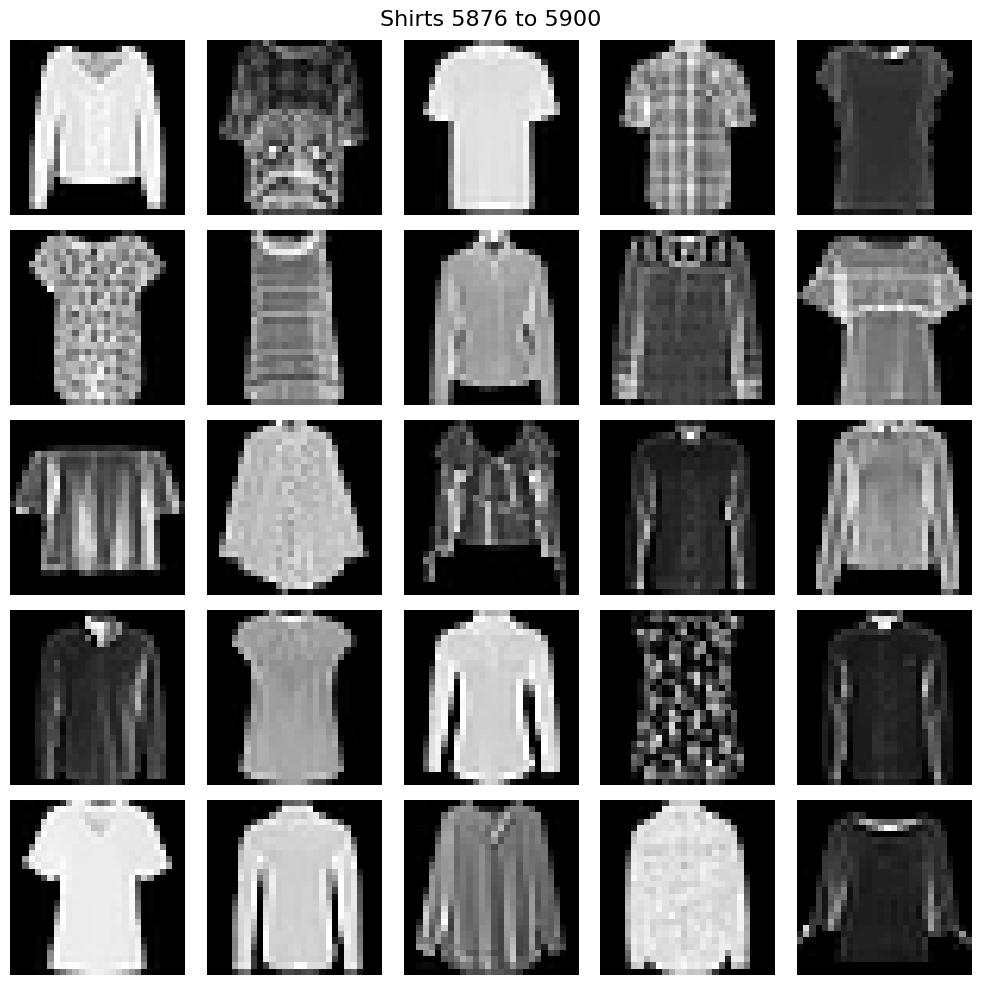

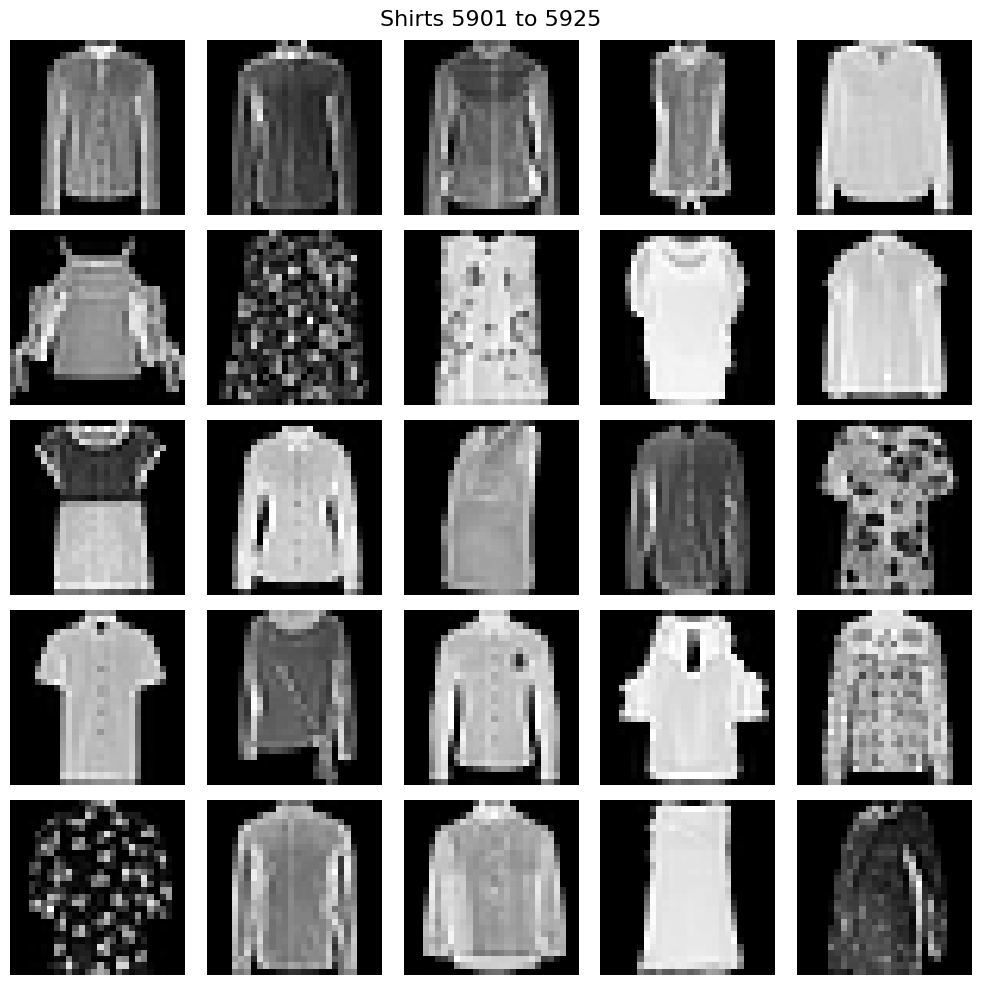

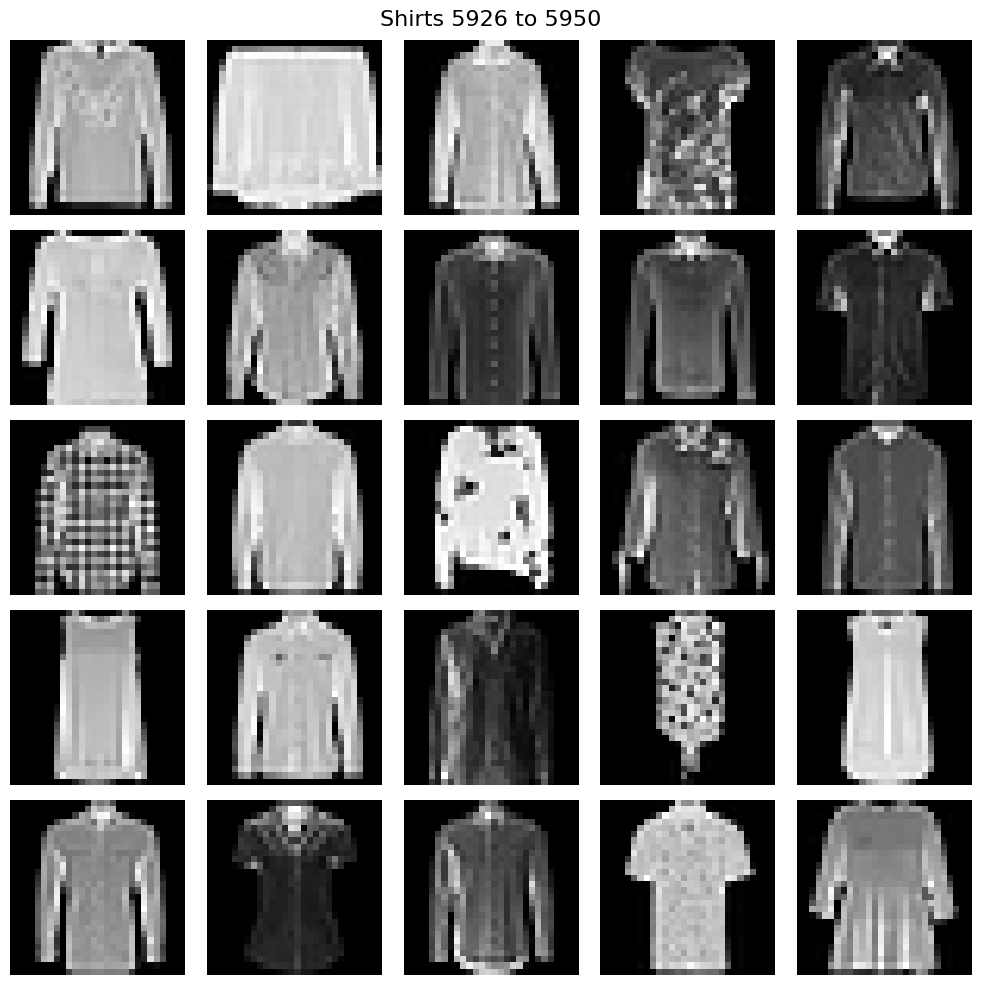

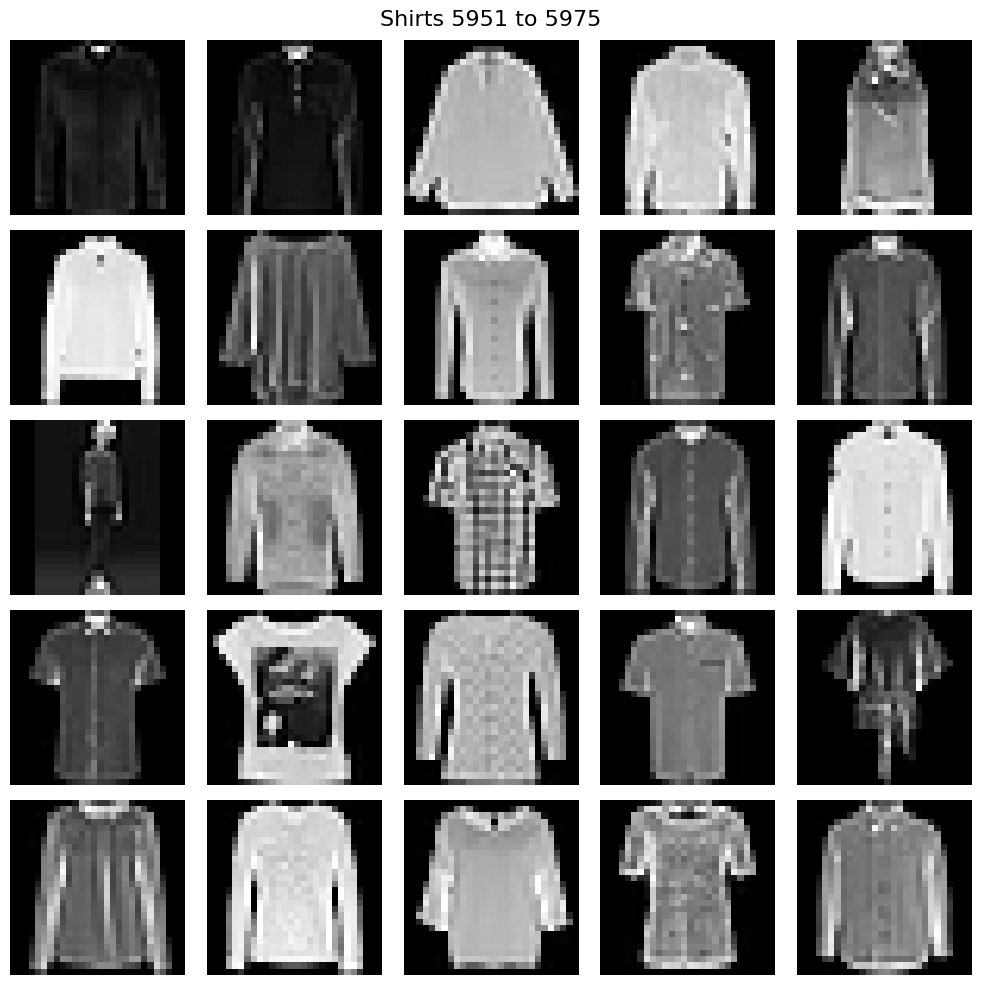

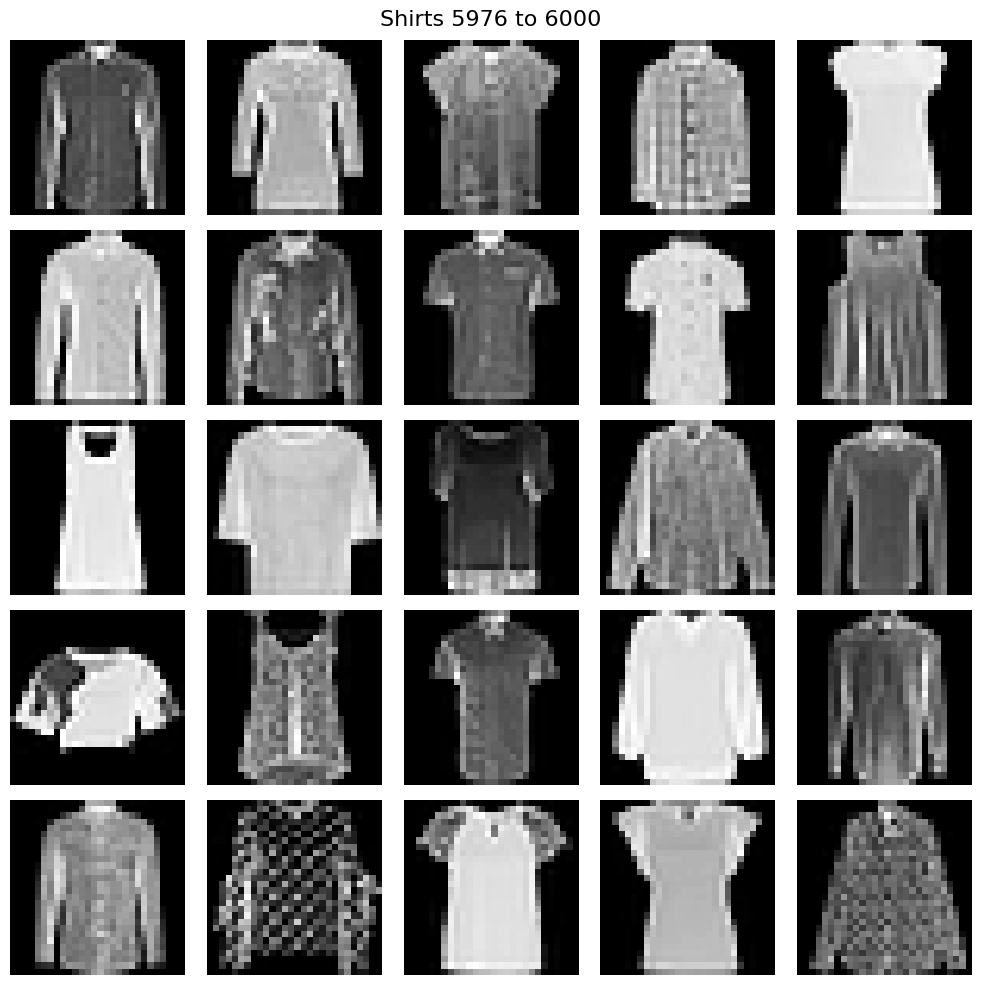

In [ ]:

# Filter images with label 6 (shirts)
shirt_indices_train = np.where(y_train_final == 6)[0]
shirt_indices_test = np.where(y_test_final == 6)[0]

shirts_train = x_train_final[shirt_indices_train]
shirts_test = x_test_final[shirt_indices_test]

# Combine the shirts from training and testing datasets
shirts_combined = np.concatenate((shirts_train, shirts_test), axis=0)

# Number of images to display
num_images_to_display = 6000  # Adjusting for 6000 images
images_per_grid = 25  # Number of images per grid
num_grids = num_images_to_display // images_per_grid  # Number of grids

# Loop through and plot each grid
for grid_idx in range(num_grids):
    plt.figure(figsize=(10, 10))
    for i in range(images_per_grid):
        idx = grid_idx * images_per_grid + i
        plt.subplot(5, 5, i + 1)

        # Reshape image back to 28x28
        img = shirts_combined[idx].reshape(28, 28)

        plt.imshow(img, cmap='gray')
        plt.axis('off')

    plt.suptitle(f"Shirts {grid_idx * images_per_grid + 1} to {(grid_idx + 1) * images_per_grid}", fontsize=16)
    plt.tight_layout()
    plt.show()


In [ ]:
import joblib

# Save the SVM model to a file
joblib.dump(xgb, 'fashion_mnist_xgb_model.pkl')


['fashion_mnist_xgb_model.pkl']

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
